In [197]:
import os
import glob
import subprocess
import json
import warnings
from typing import List, Union
from typing import Optional

import numpy as np
import pandas as pd
import geopandas as gpd
import sklearn.metrics as metrics
import pickle

import ee
import rasterio
import sankee
import fiona
from osgeo import gdal, osr, gdalconst
import numpy.ma as ma

import geemap

import matplotlib as mpl
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import statsmodels
import matplotlib.cm as cm
import matplotlib.ticker as ticker

from glob import glob
from scipy import stats
from shapely.geometry import Polygon, Point, box

from rasterio import features, mask, plot as rplot, merge
from rasterio.plot import show
from rasterstats import zonal_stats

from rio_cogeo.profiles import cog_profiles

from geopandas import GeoDataFrame
from geocube.api.core import make_geocube

from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.offsetbox import AnchoredText
from matplotlib.colors import ListedColormap, LinearSegmentedColormap, Normalize
from matplotlib_scalebar.scalebar import ScaleBar


from sklearn import ensemble
from sklearn.cluster import DBSCAN, AgglomerativeClustering

warnings.filterwarnings('ignore')

In [10]:
from functions import *

In [3]:
### data paths and geometries
cwd = os.getcwd()
dat_dir = os.path.join(cwd, 'Data\\bands')
gdf = gpd.read_file(os.path.join(cwd,'data\\BOSS\\Cleaned\\BOSS_hab_class.shp'))
coord_list = [(x,y) for x,y in zip(gdf['geometry'].x , gdf['geometry'].y)]
site_path = os.path.join(cwd,'Data\\ICoAST sites\\WGS84\\ICOAST_timeseries.shp')

In [4]:
year = '03'
#year = str(09)
rgb_stack = rasterio.open(dat_dir + '\\L5_'+year+'.tif')
process_rgb_stack(rgb_stack  = rgb_stack, dat_dir = dat_dir, year = year, geom_path = site_path)

In [3]:
kndavi_im = rasterio.open(dat_dir + '\\kndavi_21.tif')
gdf['kndavi'] = [x[0] for x in kndavi_im.sample(coord_list)]
df_gdf = pd.DataFrame(gdf)
dat_dir = os.path.join(cwd, 'Data\\Dataframes')
outdf = os.path.join(dat_dir, 'BOSS_intersect.csv')

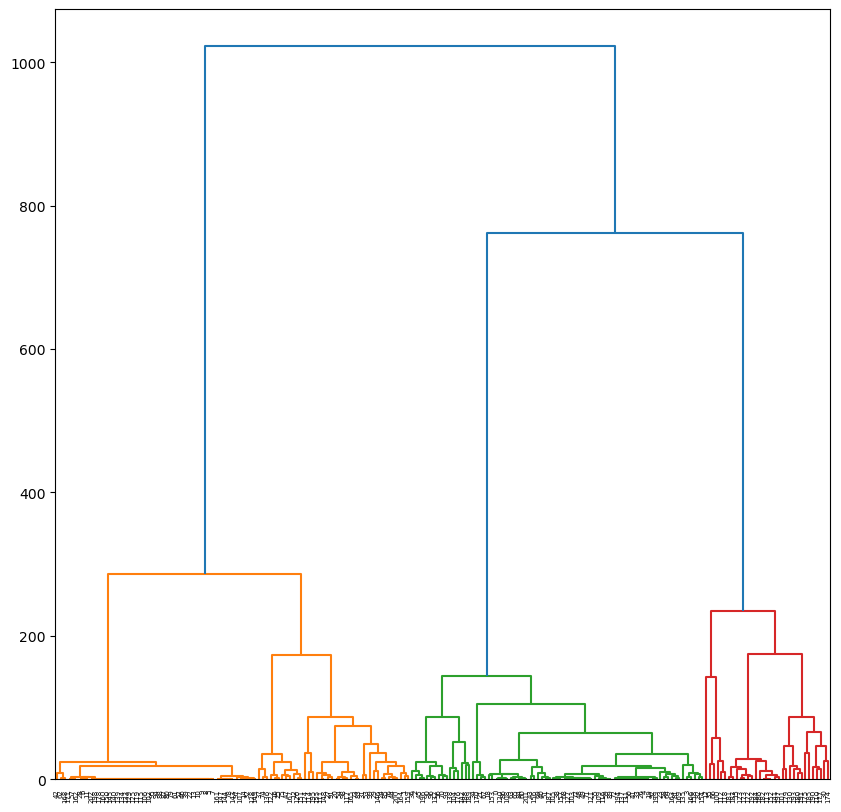

In [10]:
habs = ['broad_Cons',
        'broad_Macr',
        'broad_Seag',
        'broad_Spon',
        'broad_Ston',
        'broad_Unco',
        'broad_Unkn']

habs_c = ['broad_Cons',
        'broad_Macr',
        'broad_Seag',
        'broad_Spon',
        'broad_Ston',
        'broad_Unco',
         'Cluster']
        

sub_l = 'site == "Cervantes" or site =="Freshwater" or site =="Jurien" or site =="Lancelin" or site =="Two Rocks" or site =="Dongara"'
sub_df = filter_and_dropna(gdf = df_gdf, sub= habs, query = sub_l) 
generate_dendrogram(df = sub_df, sub = habs)

In [11]:
dat_dir  = os.path.join(cwd, 'Data')
df_dup = perform_clustering(clust_df = sub_df, sub= habs, sub_c = habs_c, dat_dir = dat_dir, gdf= gdf, que= sub_l)

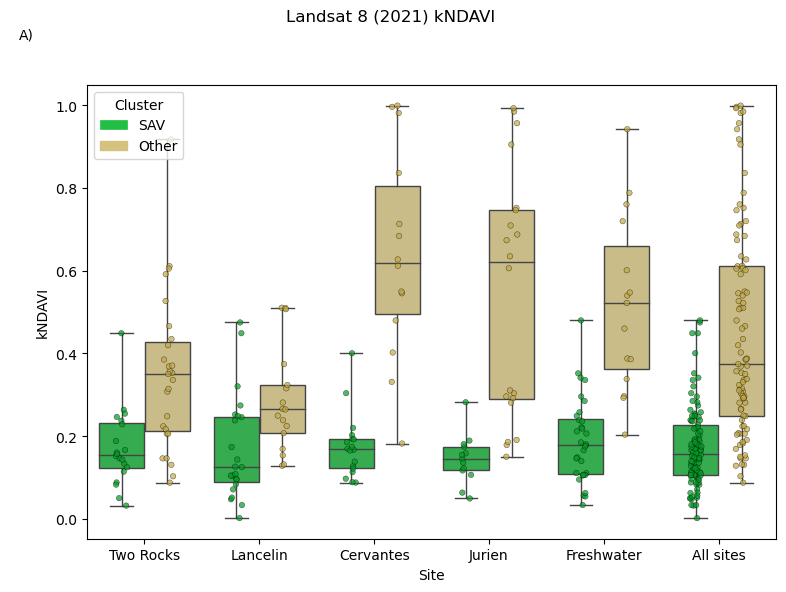

In [12]:
plot_box_strip(bdf= df_dup, loc = 'upper left')

In [50]:
import rpy2, os, warnings
warnings.filterwarnings('ignore')
os.environ["R_HOME"] = r"C:\Users\00097030\Anaconda3\envs\pygis\Lib\R"
%load_ext rpy2.ipython

In [51]:
%%R 
suppressMessages(pacman::p_load(raster, sp, sf, terra, tidyverse, ggplot2,
                 blockCV, caret, RStoolbox, randomForest,gridExtra,
                 pROC, dplyr, kableExtra, dismo, spsurvey, pdp, forestError))

In [52]:
%%R
# File Paths
poly_path <- paste(getwd(), 'Data/ICoAST sites/WGS84/ICOAST_timeseries.shp', sep = '/')
kndavi_path <- paste(getwd(), 'Data/Bands/kndavi_21.tif', sep = '/')
boss_path <- paste(getwd(), 'Data/Dataframes/BOSS_clust.csv', sep = '/')

# Read Shapefile
aoi_r <- shapefile(poly_path)
aoi_v <- vect(poly_path)

# Convert Shapefile to sf object
poly_sf <- st_as_sf(aoi_r)

# Read BOSS dataset as sf object
boss_sf <- read.csv(boss_path) %>%
  sf::st_as_sf(wkt = 'geometry', crs = 4326)

The best folds was in iteration 9:
  train_0 train_1 test_0 test_1
1      91      80     19     13
2      80      71     30     22
3      91      75     19     18
4      89      76     21     17
5      89      70     21     23


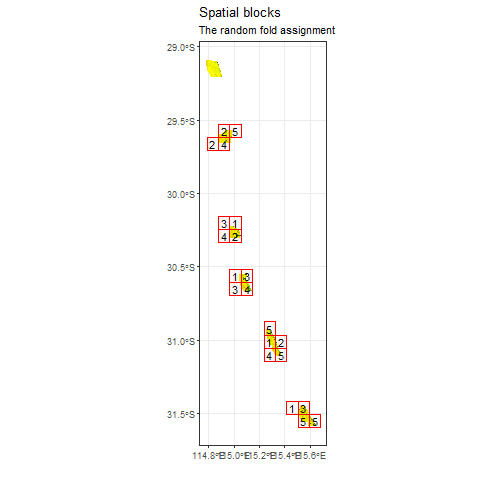

In [53]:
%%R

# Preparing Model Data Frame
# This code prepares the model data frame for training the model.

# Crop the kndavi raster using the aoi_v mask
kndavi <- rast(kndavi_path) %>%
  terra::crop(aoi_v, mask = TRUE)

# Create spatial blocks for cross-validation
sb1 <- spatialBlock(speciesData = boss_sf,
                    species = "Cluster",
                    rasterLayer = raster(kndavi),
                    theRange = 10000,
                    k = 5,
                    selection = "random",
                    iteration = 100,
                    numLimit = NULL,
                    biomod2Format = TRUE,
                    xOffset = 0.3,
                    progress = FALSE,
                    seed = 1,
                    yOffset = 0)

# Perform garbage collection to free up memory
gc()

# Create the model data frame
set.seed(8)
mod_df <- as_Spatial(boss_sf) %>%
  data.frame() %>%
  add_column(Block = sb1$foldID) %>%
  add_column(Fold = createFolds(boss_sf$sample, k = 5, list = FALSE, returnTrain = FALSE)) %>%
  dplyr::mutate(class_int = ifelse(Class == 'SAV', 1, 0)) %>%
  dplyr::mutate(class_int = as.factor(class_int)) %>%
  drop_na(kndavi)

mod_df$Site_val <- ifelse(mod_df$site == "Two Rocks", 1,
                          ifelse(mod_df$site == "Lancelin", 2,
                                 ifelse(mod_df$site == "Cervantes", 3,
                                        ifelse(mod_df$site == "Jurien", 4, 5))))

file_name <- paste(getwd(), 'R/model_df_lidar.rds', sep = '/')

In [54]:
%%R
# Random Forest Models
# This code trains and evaluates Random Forest models using cross-validation.

# Initialize variables
oob <- NULL
test_err <- NULL
kapp_train <- NULL
kapp_test <- NULL

# Perform cross-validation
for (i in 1:5) {
  # Subset data for training and testing
  train <- subset(mod_df, mod_df$Fold != i)
  fac_train <- factor(train$Cluster)
  train$Cluster <- fac_train
  
  test <- subset(mod_df, mod_df$Fold == i)
  fac_test <- factor(test$Cluster)
  test$Cluster <- fac_test
  
  test <- rbind(train[1, ], test)
  test <- test[-1, ]
  
  # Train Random Forest model
  rf_s <- randomForest(Cluster ~ kndavi,
                       data = train,
                       na.action = na.omit,
                       ntree = 1000,
                       maxnodes = 4,
                       importance = TRUE,
                       proximity = FALSE,
                       xtest = data.frame(test$kndavi),
                       ytest = test$Cluster,
                       keep.forest = TRUE)
  
  # Predict on training data and calculate accuracy
  train_pred <- predict(rf_s, train)
  conf_train <- confusionMatrix(train_pred, train$Cluster)
  kapp_train[i] <- conf_train$overall[1]
  oob[i] <- mean(rf_s$err.rate[, 1])
  
  # Predict on testing data and calculate accuracy
  test_pred <- predict(rf_s, test)
  conf_test <- confusionMatrix(test_pred, test$Cluster)
  kapp_test[i] <- conf_test$overall[1]
  test_err[i] <- mean(rf_s$test$err.rate[, 1])
}

In [55]:
%%R
# error table
# This code creates an error table from the given data and saves it as a CSV file.

# Transpose the data frame and calculate mean statistics
tab <- t(data.frame(oob, kapp_train, test_err, kapp_test))
mean_st <- as.numeric(rowMeans(tab))

# Set row and column names
row.names(tab) <- c('OOB error', 'Kappa (training)', 'Test error', 'Kappa (testing)')
colnames(tab) <- c('Fold-1', 'Fold-2', 'Fold-3', 'Fold-4', 'Fold-5')

# Convert the transposed table to a tibble and add mean column
tab_df <- tibble::rownames_to_column(as.data.frame(tab), "Statistic")
tab_df$Mean <- mean_st

# Define the file path and name for saving the CSV file
file_name <- file.path(getwd(), 'Data/Dataframes/kndavi.csv')

# Save the error table as a CSV file without row names and quotes
write.csv(tab_df, file = file_name, row.names = FALSE, quote = FALSE)

# Return the error table data frame
tab_df

         Statistic    Fold-1    Fold-2    Fold-3    Fold-4    Fold-5      Mean
1        OOB error 0.2372166 0.2146953 0.2370446 0.2019679 0.2207648 0.2223378
2 Kappa (training) 0.7804878 0.7975460 0.7904192 0.8066667 0.7916667 0.7933573
3       Test error 0.2052308 0.2499750 0.2218889 0.2643019 0.2000857 0.2282965
4  Kappa (testing) 0.7948718 0.7500000 0.7777778 0.7358491 0.8000000 0.7716997


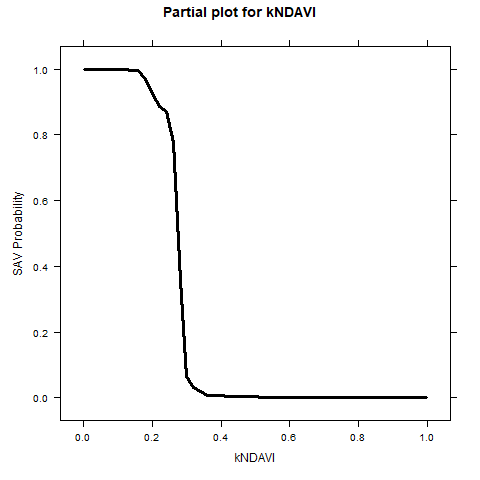

In [56]:
%%R
# Random Forest Partial Plot
# This code generates a partial plot for kNDAVI variable using randomForest package.

# Set variable labels
xlab <- 'kNDAVI'
xvar <- 'kndavi'
prob_lab <- 'SAV Probability'
zlab <- 'SAV'

# Fit random forest model
rf_pred <- randomForest(as.factor(Cluster) ~ kndavi,
                        data = mod_df,
                        na.action = na.omit,
                        ntree = 1000,
                        maxnodes = 2)

# Generate partial plot
partial_plot <- rf_pred %>% 
  partial(pred.var = c(xvar), type = 'classification', which.class = 1, prob = TRUE)

# Plot the partial plot
plotPartial(partial_plot,
            smooth = FALSE,
            main = paste('Partial plot for', xlab),
            lwd = 3, 
            ylab = prob_lab,
            xlab = xlab)

In [66]:
%%R
rf_pred
trees = getTree(rf_pred, k = 500, labelVar = TRUE)
trees

  left daughter right daughter split var split point status prediction
1             2              3    kndavi   0.2609203      1       <NA>
2             0              0      <NA>   0.0000000     -1          0
3             0              0      <NA>   0.0000000     -1          1


In [4]:
year_list = ['03','04', '05', '06', '07', '08', '09', '10',
            '11', '14', '15', '16', '17' ,'18', '19','20',
            '21', '22']
dat_dir = os.path.join(cwd, 'Data\\bands')
reclassify_kndavi(years= year_list, dat_dir = dat_dir, thresh = 0.26)

In [11]:
import glob
cwd = os.getcwd()
pred_dir = os.path.join(cwd, 'Data\\Bands\\reclass')
sav_list = glob.glob(pred_dir+'\\reclass*.tif')
sites = ['Two_rocks', 'Lancelin', 'Cervantes', 'Jurien', 'Cliff_head', 'Dongara']
site_path = os.path.join(cwd,'Data\\ICoAST sites\\WGS84\\ICOAST_timeseries.shp')

In [12]:
area_df = calculate_sav_area(sites = sites, sav_list = sav_list, cwd = cwd, site_path= site_path)

In [13]:
area_df = area_df[~((area_df['Site'] == 'Two_rocks') & (area_df['Year'] == '2007'))]

In [14]:
area_df

,Site,Year,Area SAV,Percentage SAV,Error
0,Two_rocks,2003,61.753526,55.780740,4.462459
1,Two_rocks,2004,66.926305,60.453209,4.836257
2,Two_rocks,2005,60.121696,54.306740,4.344539
3,Two_rocks,2006,66.117343,59.722489,4.777799
5,Two_rocks,2008,66.263758,59.854743,4.788379
...,...,...,...,...,...
103,Dongara,2018,76.610134,63.865042,5.109203
104,Dongara,2019,74.284673,61.926452,4.954116
105,Dongara,2020,81.631590,68.051114,5.444089
106,Dongara,2021,75.712831,63.117018,5.049361


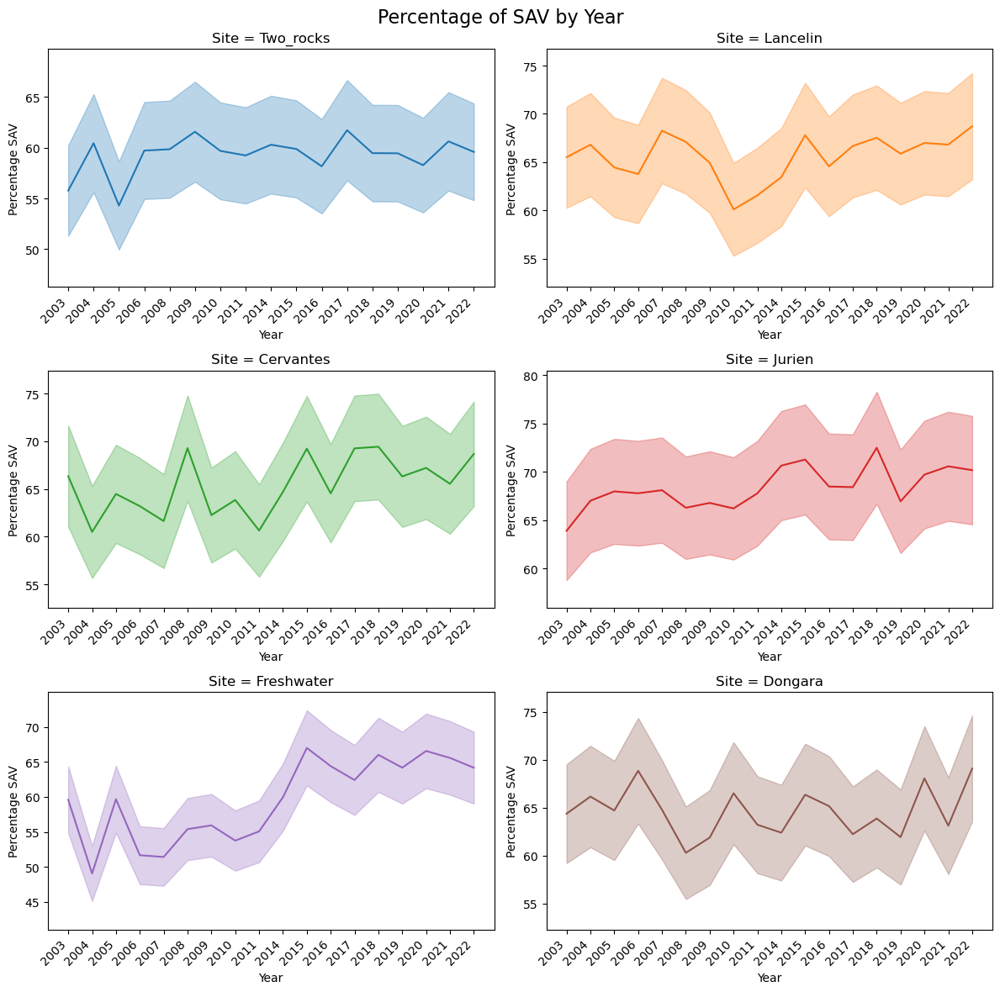

In [15]:
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 12))

# Define a list of colors for each site
site_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']

for ax, site_name, site_color in zip(axes.flatten(), area_df['Site'].unique(), site_colors):
    site_data = area_df[area_df['Site'] == site_name]
    y_min, y_max = site_data['Percentage SAV'].min(), site_data['Percentage SAV'].max()

    sns.lineplot(data=site_data,
                 x="Year",
                 y="Percentage SAV",
                 hue="Site",
                 palette=[site_color],  # Set unique color for each site
                 ax=ax)
    
    ax.fill_between(site_data['Year'], site_data['Percentage SAV'] - site_data['Error'],
                    site_data['Percentage SAV'] + site_data['Error'], color=site_color, alpha=0.3)

    ax.set_ylim(y_min - 8, y_max + 8)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')  # Set x-label rotation
    ax.set_title('Site = ' + site_name)
    ax.get_legend().remove()

fig.suptitle('Percentage of SAV by Year', fontsize=16)  # Set the plot title
plt.tight_layout()
plt.show()

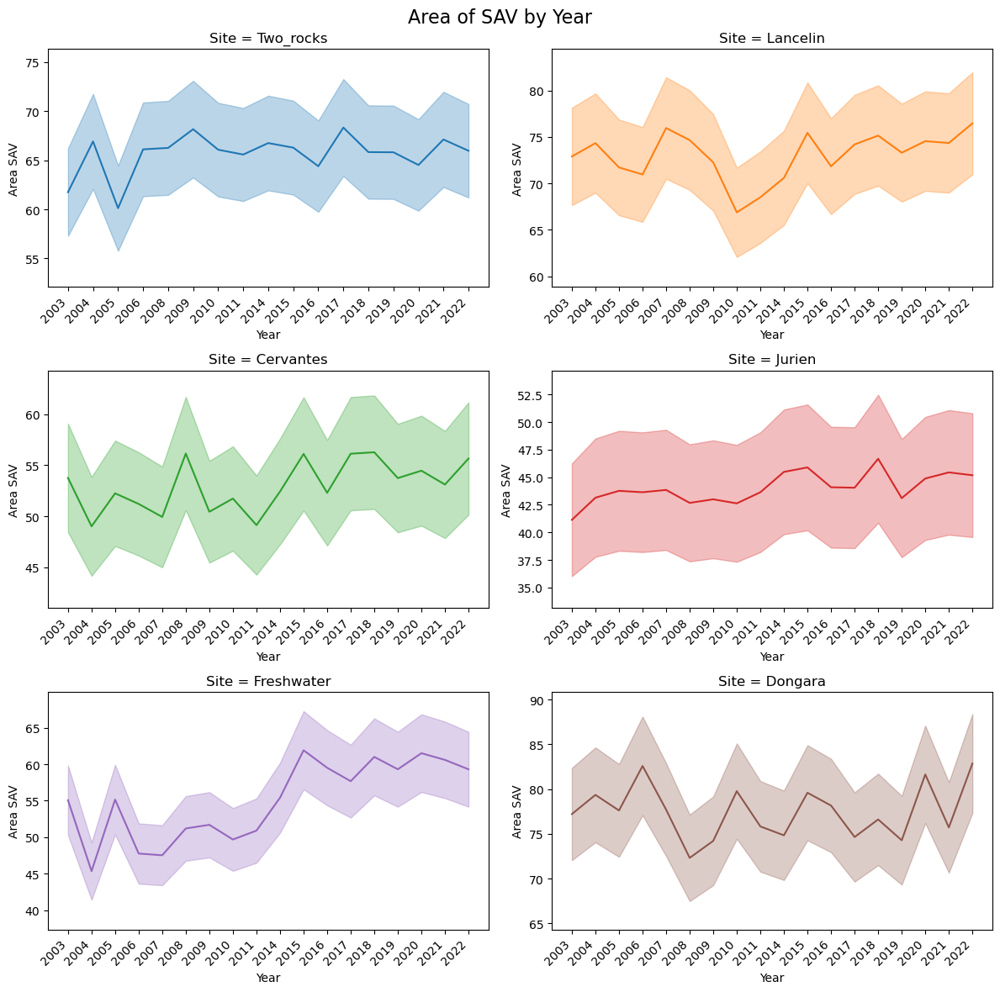

In [16]:
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 12))

# Define a list of colors for each site
site_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']

for ax, site_name, site_color in zip(axes.flatten(), area_df['Site'].unique(), site_colors):
    site_data = area_df[area_df['Site'] == site_name]
    y_min, y_max = site_data['Area SAV'].min(), site_data['Area SAV'].max()

    sns.lineplot(data=site_data,
                 x="Year",
                 y="Area SAV",
                 hue="Site",
                 palette=[site_color],  # Set unique color for each site
                 ax=ax)
    
    ax.fill_between(site_data['Year'], site_data['Area SAV'] - site_data['Error'],
                    site_data['Area SAV'] + site_data['Error'], color=site_color, alpha=0.3)

    ax.set_ylim(y_min - 8, y_max + 8)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')  # Set x-label rotation
    ax.set_title('Site = ' + site_name)
    ax.get_legend().remove()

fig.suptitle('Area of SAV by Year', fontsize=16)  # Set the plot title
plt.tight_layout()
plt.show()

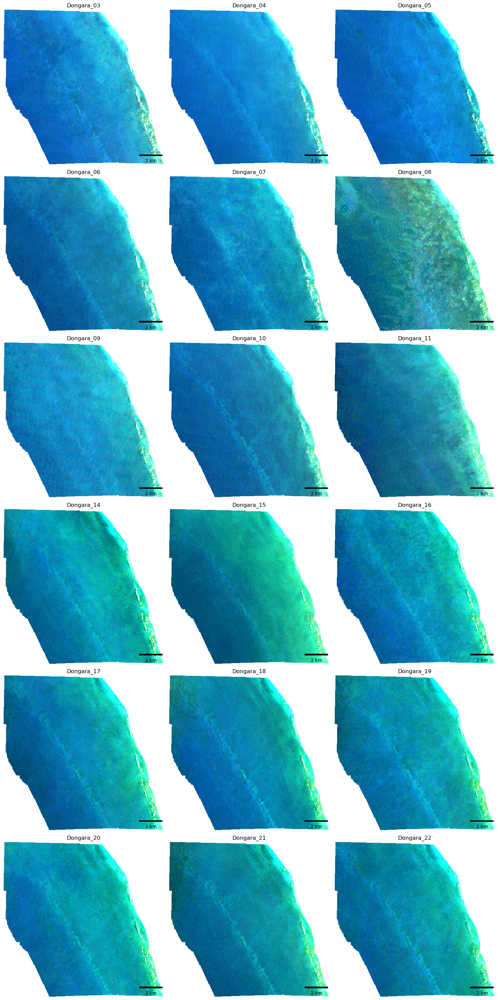

In [176]:
shapefile_path = os.path.join(cwd,'data\\ICoAST sites\\Sites\\Dongara.shp')
# Specify the folder path
folder_path = os.path.join(cwd, 'Data\\bands')

# Define the pattern to match TIF files with 'L5' or 'L8' in their names
pattern = '*[L]*.tif'  # Modify the pattern as needed

# Find the matching file paths
landsat_paths = glob.glob(os.path.join(folder_path, pattern))
numbers = []
for file_path in landsat_paths:
    number = file_path.split('_')[-1].split('.')[0]
    numbers.append(number)

# Create the subplots grid
fig, axes = plt.subplots(nrows=6, ncols=3, figsize=(15, 30))

# Iterate over the landsat paths
for i, landsat_path in enumerate(landsat_paths):
    # Calculate the row and column indices
    row = i // 3
    col = i % 3
    
    yr = numbers[i]
    # Select the subplot
    axs = axes[row, col]
    
    # Plot the cropped landsat image
    plot_cropped_landsat(landsat_path, shapefile_path, title ='Dongara_'+yr , ax = axs)
    
# Remove unused subplots
for i in range(len(landsat_paths), 18):
    row = i // 3
    col = i % 3
    fig.delaxes(axes[row, col])

# Adjust the layout
fig.tight_layout()

# Show the plot
plt.show()

IndexError: index 6 is out of bounds for axis 0 with size 6

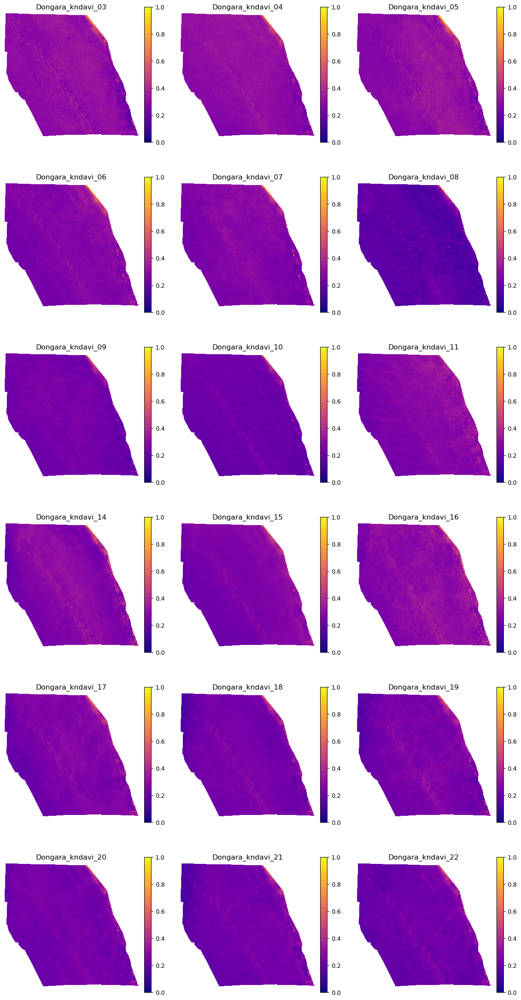

In [210]:
import glob
shapefile_path = os.path.join(cwd,'data\\ICoAST sites\\Sites\\Dongara.shp')
# Specify the folder path
folder_path = os.path.join(cwd, 'Data\\bands')

# Define the pattern to match TIF files with 'L5' or 'L8' in their names
pattern = '*[kndavi]*.tif'  # Modify the pattern as needed

# Find the matching file paths
k_paths = glob.glob(os.path.join(folder_path, pattern))
numbers = []
for file_path in k_paths:
    number = file_path.split('_')[-1].split('.')[0]
    numbers.append(number)

# Create the subplots grid
fig, axes = plt.subplots(nrows=6, ncols=3, figsize=(15, 30))

# Iterate over the landsat paths
for i, k_path in enumerate(k_paths):
    # Calculate the row and column indices
    row = i // 3
    col = i % 3
    
    yr = numbers[i]
    # Select the subplot
    axs = axes[row, col]
    
    # Plot the cropped landsat image
    plot_cropped_raster( k_path, shapefile_path, title ='Dongara_kndavi_'+yr , ax = axs)
    
# Remove unused subplots
for i in range(len(k_paths), 18):
    row = i // 3
    col = i % 3
    fig.delaxes(axes[row, col])

# Adjust the layout
fig.tight_layout()

# Show the plot
plt.show()

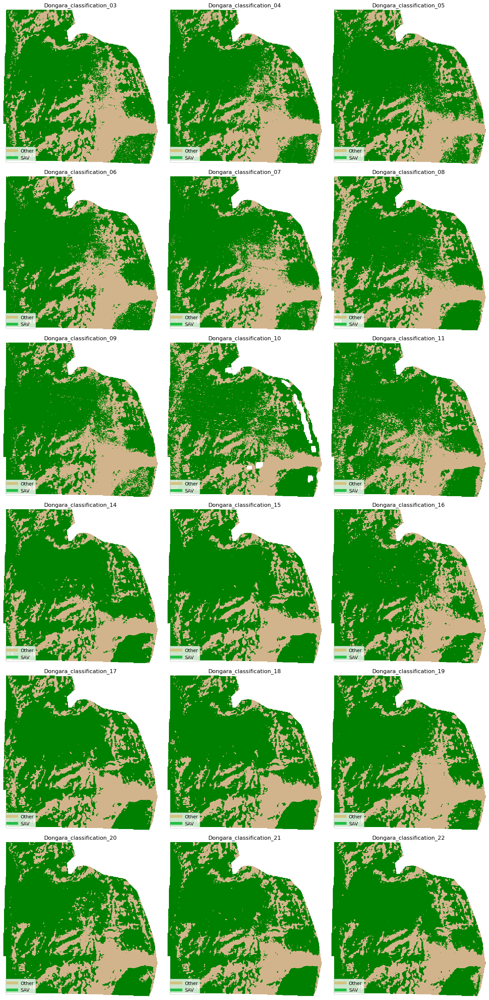

In [336]:
import glob
shapefile_path = os.path.join(cwd,'data\\ICoAST sites\\Sites\\Jurien.shp')
# Specify the folder path
folder_path = os.path.join(cwd, 'Data\\bands\\reclass')

# Define the pattern to match TIF files with 'L5' or 'L8' in their names
pattern = '*[reclass]*.tif'  # Modify the pattern as needed

# Find the matching file paths
r_paths = glob.glob(os.path.join(folder_path, pattern))
numbers = []
for file_path in r_paths:
    number = file_path.split('_')[-1].split('.')[0]
    numbers.append(number)

# Create the subplots grid
fig, axes = plt.subplots(nrows=6, ncols=3, figsize=(15, 30))

# Iterate over the landsat paths
for i, r_path in enumerate(r_paths):
    #print(r_path)
    # Calculate the row and column indices
    row = i // 3
    col = i % 3
    
    yr = numbers[i]
    # Select the subplot
    axs = axes[row, col]
    
    # Plot the cropped landsat image
    plot_class_raster(r_path, shapefile_path, title ='Dongara_classification_'+yr , ax = axs)
    
# Remove unused subplots
for i in range(len(r_paths), 18):
    row = i // 3
    col = i % 3
    fig.delaxes(axes[row, col])

# Adjust the layout
fig.tight_layout()

# Show the plot
plt.show()


In [305]:
# Specify the folder path
folder_path = os.path.join(cwd, 'Data\\bands\\reclass')
# Output the change array as a new GeoTIFF
output_path = os.path.join(cwd, 'Data\\bands\\reclass\\change.tif')
      
calculate_pixel_change(folder_path, output_path)

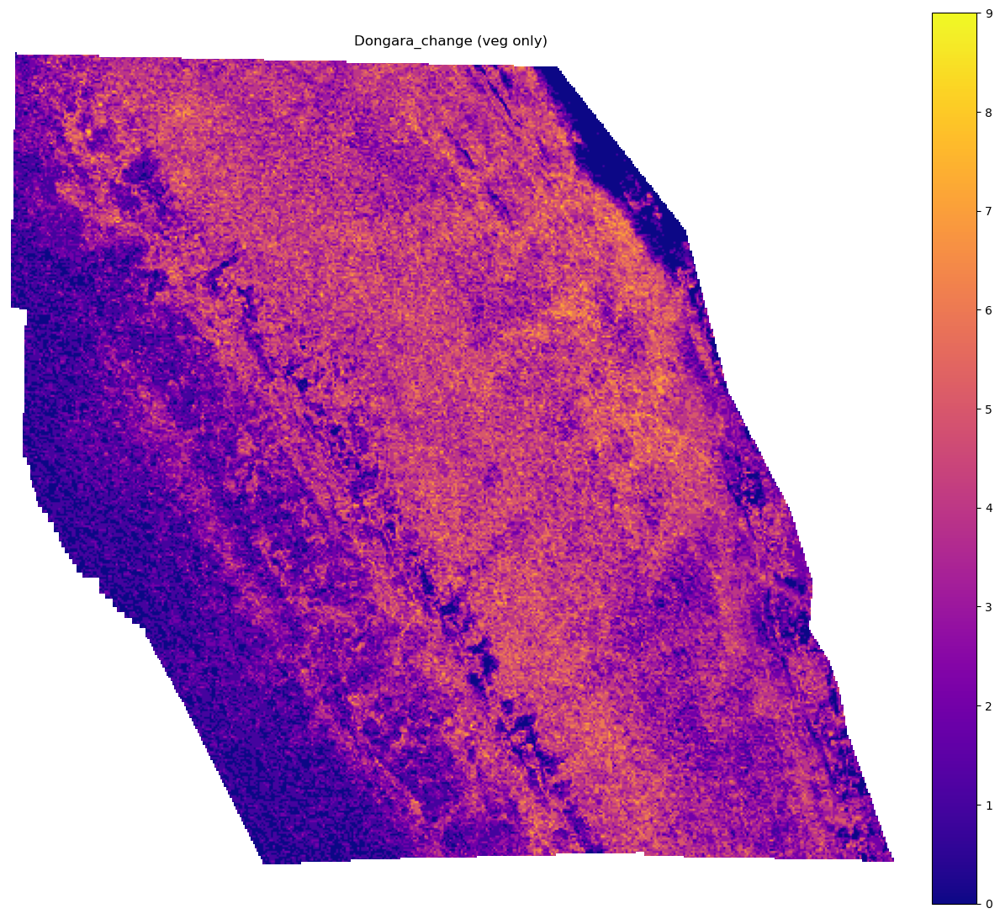

In [335]:
# Specify the shapefile and raster path
shapefile_path = os.path.join(cwd, 'data\\ICoAST sites\\Sites\\Dongara.shp')
raster_path = os.path.join(cwd, 'Data\\bands\\reclass\\change\\change.tif')

# Create the subplots grid
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(12, 12))

# Plot the cropped change raster
plot_cropped_change(raster_path, shapefile_path, title='Dongara_change (veg only)', ax=axes)

# Adjust the layout
fig.tight_layout()

# Show the plot
plt.show()


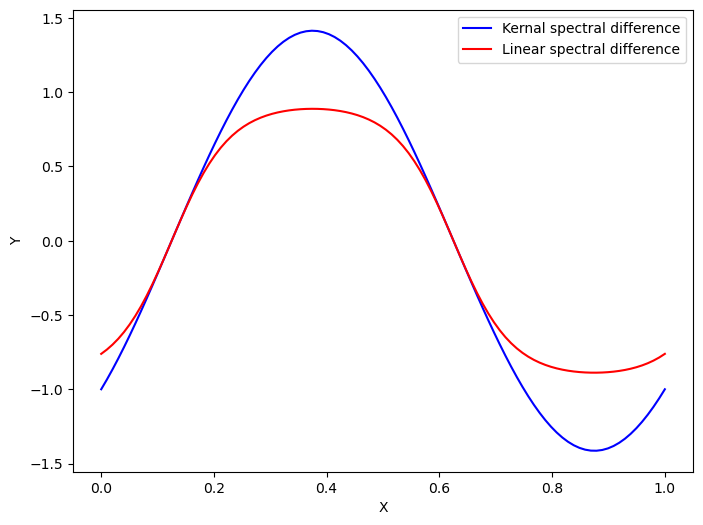

In [351]:
import numpy as np
import matplotlib.pyplot as plt

# Generate data points
x = np.linspace(0, 1, 100)

# Define the two inversely related series
series1 = np.sin(2*np.pi*x)
series2 = np.cos(2*np.pi*x)

# Compute the difference between the two series
difference = series1 - series2

# Compute the radial basis function using the hyperbolic tangent
rbf = np.tanh(difference)

# Create the plot
plt.figure(figsize=(8, 6))

# Plot the difference between the series
plt.plot(x, difference, label='Kernal spectral difference', color='blue')

# Plot the radial basis function
plt.plot(x, rbf, label='Linear spectral difference', color='red')

# Set plot title and labels
plt.title('')
plt.xlabel('X')
plt.ylabel('Y')

# Add a legend
plt.legend()

# Show the plot
plt.show()


In [348]:
difference

array([-1.        , -0.93456276, -0.86536236, -0.79267745, -0.71680071,
       -0.63803767, -0.55670548, -0.47313163, -0.38765264, -0.30061272,
       -0.21236233, -0.12325683, -0.03365503,  0.0560823 ,  0.1455938 ,
        0.23451904,  0.32249996,  0.40918229,  0.49421698,  0.57726164,
        0.65798187,  0.73605263,  0.81115958,  0.88300026,  0.95128542,
        1.01574009,  1.07610473,  1.13213628,  1.18360911,  1.23031597,
        1.27206878,  1.30869942,  1.34006039,  1.3660254 ,  1.38648992,
        1.40137153,  1.41061031,  1.41416906,  1.41203345,  1.40421208,
        1.39073645,  1.3716608 ,  1.34706197,  1.31703899,  1.28171276,
        1.24122553,  1.19574032,  1.14544028,  1.09052797,  1.03122448,
        0.96776861,  0.90041588,  0.82943749,  0.75511925,  0.67776042,
        0.59767248,  0.51517792,  0.43060893,  0.34430602,  0.25661672,
        0.16789411,  0.07849545, -0.01121928, -0.10088884, -0.19015215,
       -0.27864979, -0.3660254 , -0.45192716, -0.53600917, -0.61